# EDA, Preprocessing, and Binary Classification

只有試以下模型：
- Naive Bayes
- Logistic Regression

Try new features:
- pos tag
- 字數長度

In [10]:
# Data Analysis
import re
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
%matplotlib inline
sns.set_theme()

# Dimension reduction
from sklearn.decomposition import TruncatedSVD

# Model training and evaluation
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression

# Text Processing 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Other
import warnings
warnings.filterwarnings('ignore')

# Metrics
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import classification_report

# NLTK resource
import nltk
from nltk import word_tokenize, pos_tag_sents
# nltk.download('punkt')  # for word_tokenize
# nltk.download('wordnet')  # for WordNetLemmatizer
# nltk.download('omw-1.4')
# nltk.download('stopwords')
# nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/kanko/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

## 1: EDA

In [39]:
data = pd.read_csv('../../data/kaggle+twitter.csv', index_col=[0]).dropna().reset_index(drop=True)
data.shape

(8775, 2)

In [40]:
data.tail()

,type,flat
8770,ISFP,fight ensur power medium corpor planet treat f...
8771,ISFP,face_with_tears_of_joy sign_of_the_horns_mediu...
8772,INTJ,cst___ video light venu everyth power realli a...
8773,INFJ,support affect elementari school shoot uvald t...
8774,ENFP,hear someon open bag chip year marriag handsom...


由於 Twitter 的資料在最後面，我把他打亂並重設 index

In [41]:
data_shuffle = data.sample(frac=1, random_state=42).reset_index(drop=True)
data_shuffle

,type,flat
0,INFJ,phobic weari men feminist misogynist take pers...
1,INTJ,say necessarili know one harm sex problem bit ...
2,INFP,usual claim good decis decid order go day frie...
3,ENFJ,yeah friend relationship work togeth never met...
4,ENTP,sound like typic trait role se h fe lack ethic...
...,...,...
8770,INFJ,correct went troubl becom dish end irrespect d...
8771,ENFP,trick know valu know passion find group peopl ...
8772,INFP,ok talk friend age lot late go pose question f...
8773,INFP,even loner get lone feel like hard hard relati...


### POS tags

In [42]:
texts = data_shuffle['flat'].tolist()
tagged_texts = pos_tag_sents(map(word_tokenize, texts))

In [90]:
tagged_texts

[[('phobic', 'JJ'),
  ('weari', 'WRB'),
  ('men', 'NNS'),
  ('feminist', 'VBP'),
  ('misogynist', 'JJ'),
  ('take', 'VBP'),
  ('person', 'NN'),
  ('possibl', 'JJ'),
  ('person', 'NN'),
  ('kind', 'NN'),
  ('negat', 'JJ'),
  ('experi', 'NN'),
  ('distrust', 'NN'),
  ('men', 'NNS'),
  ('time', 'NN'),
  ('sp', 'NN'),
  ('feel', 'VB'),
  ('anti', 'JJ'),
  ('social', 'JJ'),
  ('right', 'JJ'),
  ('feel', 'NN'),
  ('like', 'IN'),
  ('talk', 'NN'),
  ('anyon', 'IN'),
  ('actual', 'JJ'),
  ('ever', 'RB'),
  ('want', 'VBP'),
  ('stay', 'NN'),
  ('isol', 'RB'),
  ('even', 'RB'),
  ('alon', 'JJ'),
  ('time', 'NN'),
  ('stop', 'VB'),
  ('feel', 'NN'),
  ('tire', 'NN'),
  ('irrit', 'NN'),
  ('emo', 'NN'),
  ('late', 'JJ'),
  ('tire', 'NN'),
  ('wait', 'NN'),
  ('furi', 'NN'),
  ('could', 'MD'),
  ('see', 'VB'),
  ('altern', 'JJ'),
  ('sp', 'JJ'),
  ('sx', 'NN'),
  ('think', 'VBP'),
  ('thing', 'NN'),
  ('ruin', 'NN'),
  ('forum', 'NN'),
  ('member', 'NN'),
  ('longer', 'RBR'),
  ('activ', 'JJ'),
  (

In [13]:
'''
查看nltk 所有支援的 pos tag，如果沒下載過請執行：
nltk.download('tagsets')
'''
# nltk.help.upenn_tagset()

[nltk_data] Downloading package tagsets to /Users/kanko/nltk_data...


$: dollar
    $ -$ --$ A$ C$ HK$ M$ NZ$ S$ U.S.$ US$
'': closing quotation mark
    ' ''
(: opening parenthesis
    ( [ {
): closing parenthesis
    ) ] }
,: comma
    ,
--: dash
    --
.: sentence terminator
    . ! ?
:: colon or ellipsis
    : ; ...
CC: conjunction, coordinating
    & 'n and both but either et for less minus neither nor or plus so
    therefore times v. versus vs. whether yet
CD: numeral, cardinal
    mid-1890 nine-thirty forty-two one-tenth ten million 0.5 one forty-
    seven 1987 twenty '79 zero two 78-degrees eighty-four IX '60s .025
    fifteen 271,124 dozen quintillion DM2,000 ...
DT: determiner
    all an another any both del each either every half la many much nary
    neither no some such that the them these this those
EX: existential there
    there
FW: foreign word
    gemeinschaft hund ich jeux habeas Haementeria Herr K'ang-si vous
    lutihaw alai je jour objets salutaris fille quibusdam pas trop Monte
    terram fiche oui corporis ...
IN: preposition or

[nltk_data]   Unzipping help/tagsets.zip.


In [44]:
data_shuffle['tagged'] = tagged_texts
'''
Categorize POS tags
Reference: https://semantria-docs.lexalytics.com/docs/tokenization-and-pos-tagging
'''
data_shuffle['nouns'] = data_shuffle['tagged'].apply(lambda x: [word for word, tag in x if tag in ['NN', 'NNS', 'NNP', 'NNPS', 'PRP$', 'PRP', 'WP', 'WP$']])
data_shuffle['verbs'] = data_shuffle['tagged'].apply(lambda x: [word for word, tag in x if tag in ['MD','VB', 'VBC', 'VBD', 'VBF', 'VBG', 'VBN', 'VBP', 'VBZ']])
data_shuffle['adj'] = data_shuffle['tagged'].apply(lambda x: [word for word, tag in x if tag in ['JJ', 'JJR', 'JJS', 'RB', 'RBR', 'RBS', 'WRB']])
data_shuffle['determiner'] = data_shuffle['tagged'].apply(lambda x: [word for word, tag in x if tag in ['DT', 'PDT', 'WDT']])
data_shuffle['misc'] = data_shuffle['tagged'].apply(lambda x: [word for word, tag in x if tag in ['CD', 'DAT', 'CC', 'EX', 'FW', 'IN', 'RP', 'TO', 'UH']])

In [45]:
# Count each category
data_shuffle['n_nouns'] = data_shuffle['nouns'].str.len()
data_shuffle['n_verbs'] = data_shuffle['verbs'].str.len()
data_shuffle['n_adj'] = data_shuffle['adj'].str.len()
data_shuffle['n_determiner'] = data_shuffle['determiner'].str.len()
data_shuffle['n_misc'] = data_shuffle['misc'].str.len()

In [46]:
def WordCount(sentence: str):
    stripped = sentence.strip()  # str
    # print(type(stripped))
    splitted = stripped.split(' ')  # list
    # print(type(splitted))
    return len(splitted)

In [47]:
# Count words for each row
data_shuffle['wordcount'] = data_shuffle['flat'].apply(WordCount)

In [48]:
data_shuffle

,type,flat,tagged,nouns,verbs,adj,determiner,misc,n_nouns,n_verbs,n_adj,n_determiner,n_misc,wordcount
0,INFJ,phobic weari men feminist misogynist take pers...,"[(phobic, JJ), (weari, WRB), (men, NNS), (femi...","[men, person, person, kind, experi, distrust, ...","[feminist, take, feel, want, stop, could, see,...","[phobic, weari, misogynist, possibl, negat, an...",[noth],"[like, anyon, like, ugh, either, ow, like, one...",179,58,90,1,18,346
1,INTJ,say necessarili know one harm sex problem bit ...,"[(say, VB), (necessarili, NNS), (know, VBP), (...","[necessarili, harm, sex, problem, bit, door, a...","[say, know, legalis, know, anim, want, want, k...","[odd, bestial, leav, wide, open, anim, abus, m...","[noth, noth]","[one, whether, one, peopl, one, toward, like, ...",322,106,157,2,27,614
2,INFP,usual claim good decis decid order go day frie...,"[(usual, JJ), (claim, NN), (good, JJ), (decis,...","[claim, decis, decid, order, day, fluster, dec...","[go, friend, get, lash, find, find, aliv, capi...","[usual, good, pointless, rather, challeng, und...","[noth, anoth, anoth]","[like, like, one, like, one, find, like, along...",257,93,136,3,29,518
3,ENFJ,yeah friend relationship work togeth never met...,"[(yeah, RB), (friend, NN), (relationship, NN),...","[friend, relationship, work, decid, grab, dinn...","[met, found, think, fell, make, sen, know, sta...","[yeah, togeth, never, similar, love, even, wel...",[anoth],"[anyth, love, one, one, one, like, boundari, o...",304,123,174,1,44,646
4,ENTP,sound like typic trait role se h fe lack ethic...,"[(sound, NN), (like, IN), (typic, JJ), (trait,...","[sound, trait, role, se, h, lack, hell, live, ...","[go, find, seem, need, find, know, chick, char...","[typic, fe, ethic, bug, least, amount, moral, ...",[anoth],"[like, like, one, along, like, without, upon, ...",136,42,80,1,13,272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8770,INFJ,correct went troubl becom dish end irrespect d...,"[(correct, JJ), (went, VBD), (troubl, JJ), (be...","[becom, end, feel, post, plea, delet, thread, ...","[went, written, would, go, thought, make, foun...","[correct, troubl, dish, irrespect, dish, sorri...","[either, either, either]","[na, though, like, in, out, anyth, one, like, ...",335,101,185,3,40,664
8771,ENFP,trick know valu know passion find group peopl ...,"[(trick, NN), (know, VBP), (valu, NN), (know, ...","[trick, valu, passion, group, peopl, valu, pas...","[know, find, especi, given, studi, hit, exceed...","[know, first, mean, second, sudden, bad, thus,...","[either, noth]","[anti, one, ofttim, though, one, though, thoug...",274,93,178,2,25,573
8772,INFP,ok talk friend age lot late go pose question f...,"[(ok, JJ), (talk, NN), (friend, NN), (age, NN)...","[talk, friend, age, lot, question, person, rel...","[go, fellow, get, damn, keep, get, go, could, ...","[ok, late, pose, notic, much, affect, tire, qu...",[],"[oh, like, without, past, beyond, around, love...",293,120,162,0,37,612
8773,INFP,even loner get lone feel like hard hard relati...,"[(even, RB), (loner, JJR), (get, VB), (lone, J...","[feel, relationship, extent, simpl, fact, some...","[get, want, shake, batghost, would, tell, stop...","[even, loner, lone, hard, hard, alon, smile, s...",[],"[like, like, know, languag, lol, like, without...",277,125,146,0,37,585


## 4: Feature engineering

這邊僅針對 flat 的欄位做處理，先轉成 Tfidf 並用 TruncatedSVD 實作 LSA

### TF-IDF

不設任何限制的 Tf-IDf 會有 78195 個 features

因此在這邊設定 max_features=5000

* Max features ordered by term frequency across the corpus.

In [50]:
vectorizer = TfidfVectorizer(analyzer="word",
                             max_features=5000,
                             lowercase=None,
                             ngram_range=(1,1)).fit(data_shuffle['flat'])
X_tfidf = vectorizer.transform(data_shuffle['flat'])
df_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=vectorizer.get_feature_names())
df_tfidf

,ab,abandon,abc,aben,abil,abl,abnorm,abort,abroad,absenc,...,yr,yummi,yup,zealand,zen,zero,zodiac,zombi,zone,zoom
0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.000000,0.025573,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.000000,0.028191,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8770,0.0,0.0,0.0,0.0,0.000000,0.023264,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
8771,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
8772,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
8773,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


### TruncatedSVD
計算出 100 個奇異值最大的值

In [51]:
svd = TruncatedSVD(n_components=100, n_iter=10, random_state=42).fit(X_tfidf)
X_svd = svd.transform(X_tfidf)
X_svd.shape

(8775, 100)

In [52]:
print(svd.explained_variance_ratio_)

[0.00953746 0.01257219 0.00734972 0.00619884 0.00609662 0.00585023
 0.00495618 0.00435337 0.00406621 0.00391197 0.00346088 0.00326971
 0.00295494 0.00288657 0.00269171 0.00265128 0.00255089 0.00252989
 0.00248492 0.00236652 0.00227749 0.00216955 0.00215067 0.00193896
 0.00188727 0.00187454 0.00183126 0.00176162 0.00174188 0.0017197
 0.00168961 0.00165227 0.00161279 0.00155444 0.00153153 0.0015281
 0.00150315 0.00147112 0.00143935 0.00142007 0.00139731 0.00137743
 0.00136227 0.00135242 0.0013493  0.00132974 0.00131053 0.00130459
 0.00128908 0.00128549 0.00126371 0.00125038 0.00124483 0.00124098
 0.00122297 0.0012109  0.00120003 0.00119035 0.00118535 0.0011801
 0.00116824 0.00115346 0.00114995 0.00114383 0.00113247 0.0011243
 0.00111832 0.00111669 0.00110493 0.00109926 0.00109349 0.00108897
 0.00107931 0.00106611 0.00106527 0.00106279 0.0010514  0.0010475
 0.00103997 0.00103635 0.00102811 0.0010191  0.00101727 0.00101432
 0.00100878 0.00099808 0.00099149 0.00098638 0.00097774 0.00097664


In [53]:
svd.explained_variance_ratio_.sum()

0.19447312018749988

## Binary Classification

In [55]:
def get_types(row):
    t=row['type']

    I = 0; N = 0
    T = 0; J = 0
    
    if t[0] == 'I': I = 1
    elif t[0] == 'E': I = 0
        
    if t[1] == 'N': N = 1
    elif t[1] == 'S': N = 0

    if t[2] == 'T': T = 1
    elif t[2] == 'F': T = 0
        
    if t[3] == 'J': J = 1
    elif t[3] == 'P': J = 0
    return pd.Series( {'IE':I, 'NS':N , 'TF': T, 'JP': J }) 

In [74]:
data_labeled = data_shuffle.join(data_shuffle.apply (lambda row: get_types (row),axis=1))

最後，我們的資料集包含了

X 特徵：文字本身的特徵`'X_svd`，
、額外生成的特徵
`'n_nouns','n_verbs','n_adj','n_determiner','n_misc','wordcount'` 

Y 預測類別 `'type','IE','NS','TF','JP'`

In [75]:
df = pd.concat([data_labeled[['type','IE','NS','TF','JP','n_nouns','n_verbs','n_adj','n_determiner','n_misc','wordcount']],
                pd.DataFrame(X_svd)], axis=1)

In [89]:
# Store data to csv
df.to_csv('../../data/kag_tw_withPOS.csv', index=False)

In [79]:
X = df.loc[:, 'n_nouns':]
y = df.loc[:, :'JP']

#### Training and Testing Split

Only executive one time.

In [81]:
# Train test split
X_train_IE, X_test_IE, Y_train_IE, Y_test_IE = train_test_split(X, y['IE'], test_size=0.2, random_state=42, stratify=y['IE'])
X_train_NS, X_test_NS, Y_train_NS, Y_test_NS = train_test_split(X, y['NS'], test_size=0.2, random_state=42, stratify=y['NS'])
X_train_TF, X_test_TF, Y_train_TF, Y_test_TF = train_test_split(X, y['TF'], test_size=0.2, random_state=42, stratify=y['TF'])
X_train_JP, X_test_JP, Y_train_JP, Y_test_JP = train_test_split(X, y['JP'], test_size=0.2, random_state=42, stratify=y['JP'])

In [82]:
IE_dataset = {"X_train": X_train_IE, "X_test": X_test_IE, "Y_train": Y_train_IE, "Y_test": Y_test_IE}
NS_dataset = {"X_train": X_train_NS, "X_test": X_test_NS, "Y_train": Y_train_NS, "Y_test": Y_test_NS}
TF_dataset = {"X_train": X_train_TF, "X_test": X_test_TF, "Y_train": Y_train_TF, "Y_test": Y_test_TF}
JP_dataset = {"X_train": X_train_JP, "X_test": X_test_JP, "Y_train": Y_train_JP, "Y_test": Y_test_JP}

In [83]:
print(f'Each dataset:\nTrain|| X:{X_train_IE.shape}\tY:{Y_train_IE.shape} \nTest || X:{X_test_IE.shape}\tY:{Y_test_IE.shape}\n')

Each dataset:
Train|| X:(7020, 106)	Y:(7020,) 
Test || X:(1755, 106)	Y:(1755,)



#### Model method

In [84]:
def fitCV(model):
    '''
    Input: Base model
    Output: Models for each dimension
    '''
    # Cross validation
    grid1 = GridSearchCV(model,{},cv=10)
    grid2 = GridSearchCV(model,{},cv=10)
    grid3 = GridSearchCV(model,{},cv=10)
    grid4 = GridSearchCV(model,{},cv=10)
    # Fit
    model_IE = grid1.fit(X_train_IE,Y_train_IE)
    model_NS = grid2.fit(X_train_NS,Y_train_NS)
    model_TF = grid3.fit(X_train_TF,Y_train_TF)
    model_JP = grid4.fit(X_train_JP,Y_train_JP)

    return model_IE,model_NS,model_TF,model_JP

In [85]:
def predictCV(model_IE,model_NS,model_TF,model_JP):
    '''
    Input: 4 models
    Output: Predict on test data for each dimension
    '''
    ypredIE = model_IE.best_estimator_.predict(X_test_IE)
    ypredNS = model_NS.best_estimator_.predict(X_test_NS)
    ypredTF = model_TF.best_estimator_.predict(X_test_TF)
    ypredJP = model_JP.best_estimator_.predict(X_test_JP)
    return ypredIE, ypredNS, ypredTF, ypredJP

#### Evaluation method

In [96]:
def print_classification_report(ypredIE, ypredNS, ypredTF, ypredJP):
   '''
   Function to print Classification Report of the given model
   This function takes 4 predicted output datasets as input.
   It computes classfication report: accuracy, recall, f1-score.
   It prints classification reports for all 4 predictions (models).
   '''
   print(f'Classification Report for Introversion(I) / Extroversion(E):\n {classification_report(Y_test_IE, ypredIE)}\n')
   print(f'Classification Report for Intuition(N) / Sensing(S):\n {classification_report(Y_test_NS, ypredNS)}\n')
   print(f'Classification Report for Thinking(T) / Feeling(F):\n{classification_report(Y_test_TF, ypredTF)}\n')
   print(f'Classification Report for Judging(J) / Perceiving(P):\n {classification_report(Y_test_JP, ypredJP)}\n')


def print_confusion_matrix(ypredIE, ypredNS, ypredTF, ypredJP):
   cm = confusion_matrix(Y_test_IE, ypredIE)
   plt.figure(figsize=(5,4))
   sns.heatmap(cm, annot=True,cmap='Reds_r',fmt='g')
   plt.ylabel('Y_test_IE')
   plt.xlabel('ypredIE')
   plt.title('Confusion matrix for Introversion(I) / Extroversion(E): ', size=12)

   cm = confusion_matrix(Y_test_NS, ypredNS)
   plt.figure(figsize=(5,4))
   sns.heatmap(cm, annot=True,cmap='Greens_r',fmt='g')
   plt.ylabel('Y_test_NS')
   plt.xlabel('ypredNS')
   plt.title('Confusion matrix for Intuition(N) / Sensing(S): ', size=12)

   cm = confusion_matrix(Y_test_TF, ypredTF)
   plt.figure(figsize=(5,4))
   sns.heatmap(cm, annot=True,cmap='Blues_r',fmt='g')
   plt.ylabel('Y_test_TF')
   plt.xlabel('ypredTF')
   plt.title('Confusion matrix for Thinking(T) / Feeling(F): ', size=12)

   cm = confusion_matrix(Y_test_JP, ypredJP)
   plt.figure(figsize=(5,4))
   sns.heatmap(cm, annot=True,cmap='Purples_r',fmt='g')
   plt.ylabel('Y_test_JP')
   plt.xlabel('ypredJP')
   plt.title('Confusion matrix for Judging(J) / Perceiving(P): ', size=12)


def print_roc_auc_curve(probIE, probNS, probTF, probJP, title:str):
   fp_IE, tp_IE, _ = roc_curve(Y_test_IE, probIE[:,1])
   fp_NS, tp_NS, _ = roc_curve(Y_test_NS, probNS[:,1])
   fp_TF, tp_TF, _ = roc_curve(Y_test_TF, probTF[:,1])
   fp_JP, tp_JP, _ = roc_curve(Y_test_JP, probJP[:,1])
   plt.figure(figsize=(8,5))
   plt.plot(fp_IE, tp_IE, linestyle=':', color='indianred', label=f'Introversion(I) / Extroversion(E) (area={auc(fp_IE, tp_IE):.2f})',linewidth=1.8)
   plt.plot(fp_NS, tp_NS, linestyle='--', color='darkseagreen', label=f'Intuition(N) / Sensing(S) (area={auc(fp_NS, tp_NS):.2f})',linewidth=1.8)
   plt.plot(fp_TF, tp_TF, linestyle='-.', color='dodgerblue', label=f'Thinking(T) / Feeling(F) (area={auc(fp_TF, tp_TF):.2f})',linewidth=1.8)
   plt.plot(fp_JP, tp_JP, linestyle='--', color='orchid', label=f'Judging(J) / Perceiving(P) (area={auc(fp_TF, tp_TF):.2f})',linewidth=1.8)
   plt.xlabel('False Positive Rate')
   plt.ylabel('True Positive Rate')
   plt.title(title+' ROC Curve')
   plt.legend(loc='best')
   # plt.savefig('../img/ROC_tw_'+title+'.png')

### Training

#### Naive Bayes Model

In [97]:
gNB = GaussianNB()
# Fit
gNB_IE, gNB_NS, gNB_TF, gNB_JP = fitCV(gNB)
# Prediction
ypredIE, ypredNS, ypredTF, ypredJP = predictCV(gNB_IE,gNB_NS,gNB_TF,gNB_JP)
# Print classification report
print_classification_report(ypredIE, ypredNS, ypredTF, ypredJP)

Classification Report for Introversion(I) / Extroversion(E):
               precision    recall  f1-score   support

           0       0.50      0.03      0.05       411
           1       0.77      0.99      0.87      1344

    accuracy                           0.77      1755
   macro avg       0.63      0.51      0.46      1755
weighted avg       0.71      0.77      0.68      1755


Classification Report for Intuition(N) / Sensing(S):
               precision    recall  f1-score   support

           0       0.69      0.04      0.08       254
           1       0.86      1.00      0.92      1501

    accuracy                           0.86      1755
   macro avg       0.77      0.52      0.50      1755
weighted avg       0.84      0.86      0.80      1755


Classification Report for Thinking(T) / Feeling(F):
              precision    recall  f1-score   support

           0       0.78      0.03      0.06       951
           1       0.46      0.99      0.63       804

    accuracy

In [1]:
# Confusion matrix
print_confusion_matrix(ypredIE, ypredNS, ypredTF, ypredJP)

NameError: name 'print_confusion_matrix' is not defined

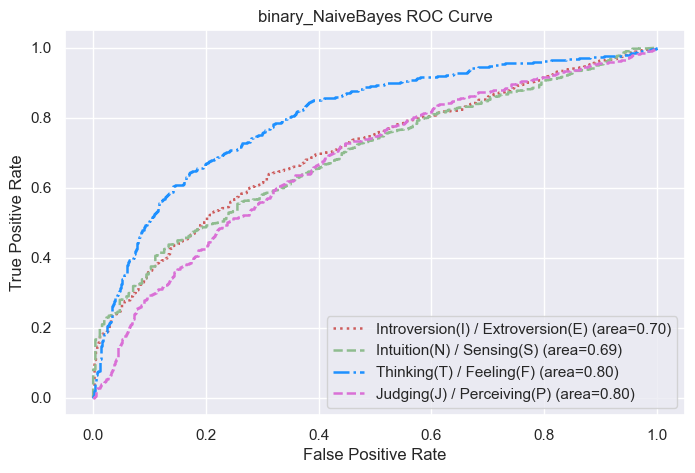

In [99]:
# ROC curve
print_roc_auc_curve(gNB_IE.best_estimator_.predict_proba(X_test_IE),
                    gNB_NS.best_estimator_.predict_proba(X_test_NS),
                    gNB_TF.best_estimator_.predict_proba(X_test_TF),
                    gNB_JP.best_estimator_.predict_proba(X_test_JP),
                    title='binary_NaiveBayes')

#### Logistic Regression

In [105]:
log = LogisticRegression(random_state=42,max_iter=500)
# Fit
log_IE, log_NS, log_TF, log_JP = fitCV(log)
# Prediction
ypredIE, ypredNS, ypredTF, ypredJP = predictCV(log_IE,log_NS,log_TF,log_JP)
# Print classification report
print_classification_report(ypredIE, ypredNS, ypredTF, ypredJP)

Classification Report for Introversion(I) / Extroversion(E):
               precision    recall  f1-score   support

           0       0.49      0.08      0.14       411
           1       0.78      0.97      0.86      1344

    accuracy                           0.77      1755
   macro avg       0.63      0.53      0.50      1755
weighted avg       0.71      0.77      0.69      1755


Classification Report for Intuition(N) / Sensing(S):
               precision    recall  f1-score   support

           0       0.67      0.03      0.06       254
           1       0.86      1.00      0.92      1501

    accuracy                           0.86      1755
   macro avg       0.76      0.51      0.49      1755
weighted avg       0.83      0.86      0.80      1755


Classification Report for Thinking(T) / Feeling(F):
              precision    recall  f1-score   support

           0       0.77      0.78      0.78       951
           1       0.74      0.72      0.73       804

    accuracy

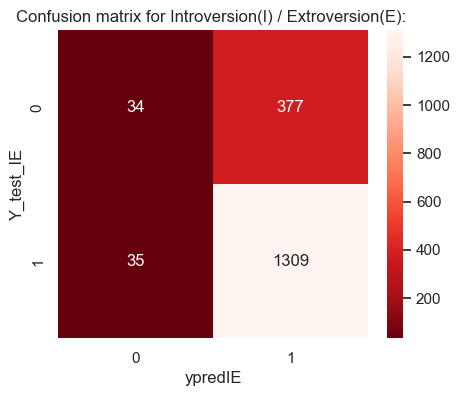

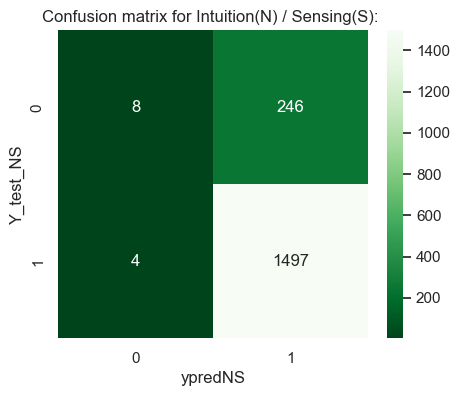

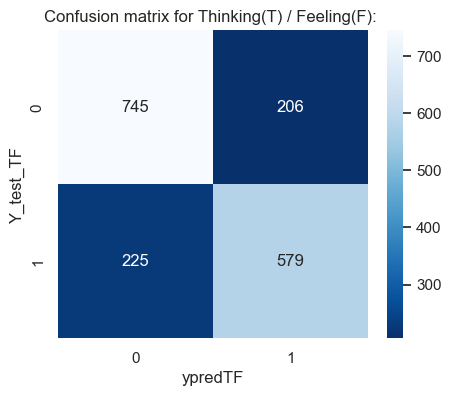

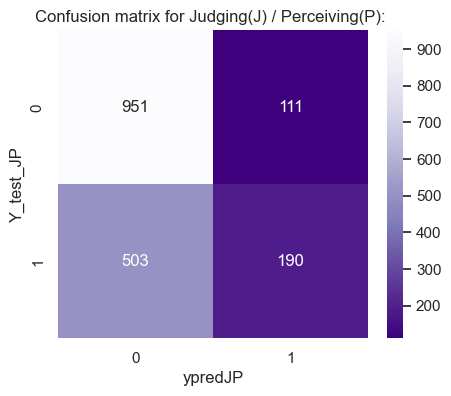

In [106]:
# Confusion matrix
print_confusion_matrix(ypredIE, ypredNS, ypredTF, ypredJP)

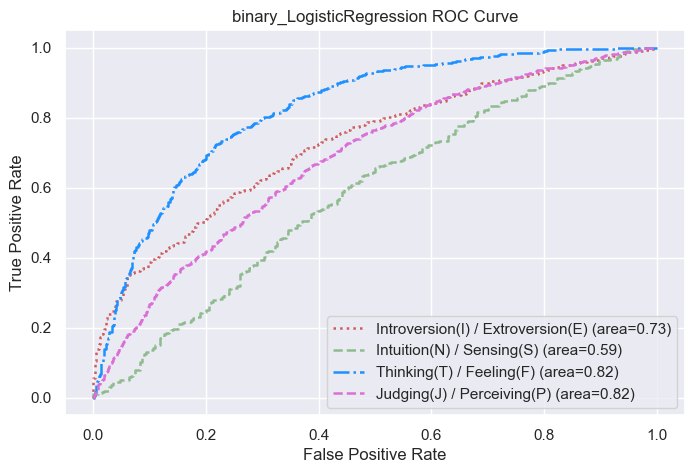

In [107]:
# ROC curve
print_roc_auc_curve(log_IE.best_estimator_.predict_proba(X_test_IE),
                    log_NS.best_estimator_.predict_proba(X_test_NS),
                    log_TF.best_estimator_.predict_proba(X_test_TF),
                    log_JP.best_estimator_.predict_proba(X_test_JP),
                    title='binary_LogisticRegression')

## Test on Celebrity dataset
利用名人 Twitter 資料集來預測陌生資料的 MBTI

### Preprocess

In [109]:
# # If you didn't install emoji before:
# !pip install emoji --upgrade
import emoji

In [110]:
def combineRow(data):
	tweet_data = []  
	tmp = data.copy()
	m = tmp['tweet'].str.contains('\w+')
	tmp_ = tmp[m].groupby((~m).cumsum(), as_index=False).agg(', '.join)
	tweet_data.append(tmp_)
	tweet_data = pd.concat(tweet_data)
	return tweet_data

def processEmoji(data):
	for i in range(len(data)):
		post = data.at[i, 'tweet']
		result = re.findall(r'\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[A-Za-z][0-9]\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[A-Za-z][0-9]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][A-Za-z]\\x[A-Za-z][0-9]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[A-Za-z][0-9]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[0-9][0-9]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[0-9][A-Za-z]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[0-9][0-9]\\x[A-Za-z][A-Za-z]|\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]\\x[A-Za-z][0-9]\\x[A-Za-z][0-9]|\\x[A-Za-z][0-9]\\x[0-9][0-9]\\x[0-9][0-9]|\\x[A-Za-z][0-9]\\x[0-9][0-9]\\x[A-Za-z][0-9]\\x[A-Za-z][A-Za-z]\\x[A-Za-z][0-9]\\x[0-9][A-Za-z]|\\x[A-Za-z][0-9]\\x[0-9][0-9]\\x[0-9][A-Za-z]', post)
		string_ = []
		for j in result:
			string_.append(j.encode().decode('unicode_escape').encode("raw_unicode_escape"))
			emoji_list = []
		for k in string_:
			emoji_list.append(k.decode("utf-8", errors='ignore'))
			emoji_text = []
		for m in range(len(emoji_list)):
			emoji_text.append(emoji.demojize(emoji_list[m]))
			post_list = []
		for l in range(len(result)):
			post = post.replace(result[l] , emoji_text[l])
			data.tweet[i] = post
	return data

def Preprocessor_test(text):
    # Cleaning
    text = re.sub(r'\|\|\|', ' ', text)  # Split by separator
    text = re.sub(r'http\S+', ' ', text)  # Replace hyperlink
    text = re.sub(r'\d',' ', text)  # 去除數字
    text = re.sub(r'^b\'', ' ', text) 
    text = re.sub(r"[A-Za-z]+\'+\w+", ' ', text)  # Handling apostrophe (e.g. you've, there's)
    text = re.sub(r'x[A-Za-z]', ' ', text)
    text = re.sub(r'\b[A-Za-z]\b', ' ', text)
    text = re.sub(r"\@+[A-Za-z]+\w+", ' ', text)
    text = re.sub(r'\bR[A-Z]\b', ' ', text)
    text = re.sub(r'[.,"\'\-?:!;@#&()]', ' ', text)
    text = re.sub(r'\\',' ', text)
    text = re.sub(r'[’“”/]', ' ', text)
    # text = re.sub('[^0-9a-zA-Z]',' ', text)  # Keep only numbers and alphabets (remove special characters)
    # text = re.sub(r'\b[A-Za-z]\b', ' ', text)
    text = text.lower()
    text = re.sub('intj|intp|entj|entp|infp|enfj|enfp|istj|isfj|estj|esfj|istp|isfp|estp|esfp|infj', '', text)
    # Tokenization
    tokens = word_tokenize(text)
    filtered_tokens = [w for w in tokens if not w in stopwords.words('english')]  # Remove stopwords
    # Stemming
    stemmer_ = SnowballStemmer("english")
    stemmed = [stemmer_.stem(t) for t in filtered_tokens]
    # Lemmatizing
    lemma = WordNetLemmatizer()
    lemmatized = " ".join([lemma.lemmatize(w) for w in stemmed])
    return lemmatized

def test_text(data):
	for i in range(len(data)):
		post = data.loc[i, 'tweet']

		text = Preprocessor_test(post)

		data.tweet[i] = text
	return data

預測會用到的 function

In [112]:
modelList = {'gNB': [gNB_IE, gNB_NS, gNB_TF, gNB_JP],
            'log': [log_IE, log_NS, log_TF, log_JP]}

### Case 1 Adele: ENTJ

In [113]:
def predictMBTI(model:str , svd):
    pred_IE = modelList[str(model)][0].predict(svd)
    pred_NS = modelList[str(model)][1].predict(svd)
    pred_TF = modelList[str(model)][2].predict(svd)
    pred_JP = modelList[str(model)][3].predict(svd)
    
    char = []  # list for storing result
    char.append('I') if pred_IE else char.append('E')
    char.append('N') if pred_NS else char.append('S')
    char.append('T') if pred_TF else char.append('F')
    char.append('J') if pred_JP else char.append('P')

    return ''.join(char)

In [114]:
df_adele = pd.read_csv('../../data/Adele.csv')
df_adele

,twitter_id,date,tweet
0,1543973875687596033,2022-07-04 15:03:52+00:00,b'Thank you to my band and my crew for two sea...
1,1543973499508752386,2022-07-04 15:02:22+00:00,b'Hyde Park Night 2! My heart is absolutely fu...
2,1543254652807954439,2022-07-02 15:25:56+00:00,"b'Thank you my loves, I can\xe2\x80\x99t wait ..."
3,1543254498247835648,2022-07-02 15:25:19+00:00,b'Hyde Park Night 1! What a crowd!! https://t....
4,1542530240060194816,2022-06-30 15:27:22+00:00,b'Who\xe2\x80\x99s ready for tomorrow!? https:...
...,...,...,...
360,29513802932,2010-11-02 22:54:44+00:00,b'RT @ColumbiaRecords: NEWS: Adele @OfficialAd...
361,29419669509,2010-11-02 00:05:24+00:00,"b""Head over to Adele's newly re-designed websi..."
362,29104016829,2010-10-29 16:37:36+00:00,b'Adele has a new blog up at http://www.adele....
363,27248872792,2010-10-13 14:58:33+00:00,b'Adele has a new blog up at her website. Chec...


In [115]:
adele_data = combineRow(df_adele)
adele_data = processEmoji(adele_data)
adele_data = test_text(adele_data)

In [126]:
adele_data

,date,tweet
0,"2022-07-04 15:03:52+00:00, 2022-07-04 15:02:22...",thank band crew two seamless show huge thank e...


In [120]:
adele_tfidf = vectorizer.transform(adele_data.tweet)
adele_svd = svd.transform(adele_tfidf)

In [132]:
# POS tag
adele_texts = adele_data['tweet'].tolist()
tagged_texts = pos_tag_sents(map(word_tokenize, adele_texts))
adele_data['tagged'] = tagged_texts
adele_data['nouns'] = adele_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['NN', 'NNS', 'NNP', 'NNPS', 'PRP$', 'PRP', 'WP', 'WP$']])
adele_data['verbs'] = adele_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['MD','VB', 'VBC', 'VBD', 'VBF', 'VBG', 'VBN', 'VBP', 'VBZ']])
adele_data['adj'] = adele_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['JJ', 'JJR', 'JJS', 'RB', 'RBR', 'RBS', 'WRB']])
adele_data['determiner'] = adele_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['DT', 'PDT', 'WDT']])
adele_data['misc'] = adele_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['CD', 'DAT', 'CC', 'EX', 'FW', 'IN', 'RP', 'TO', 'UH']])
# Count each category
adele_data['n_nouns'] = adele_data['nouns'].str.len()
adele_data['n_verbs'] = adele_data['verbs'].str.len()
adele_data['n_adj'] = adele_data['adj'].str.len()
adele_data['n_determiner'] = adele_data['determiner'].str.len()
adele_data['n_misc'] = adele_data['misc'].str.len()
# Count words for each row
adele_data['wordcount'] = adele_data['tweet'].apply(WordCount)

In [135]:
adele = pd.concat([adele_data[['n_nouns','n_verbs','n_adj','n_determiner','n_misc','wordcount']],
                    pd.DataFrame(adele_svd)], axis=1)
adele_x = np.asarray(adele.loc[0].values.flatten().tolist()).reshape(1,-1)

In [148]:
# truth: ENTJ
for idx, (k,v) in enumerate(modelList.items()):
    print(f'Result from model {k}: {predictMBTI(k, adele_x)}')

Result from model gNB: INTJ
Result from model log: INFP


### Case 2 Anna Kendrick: ENTP

In [149]:
df_anna = pd.read_csv('../../data/AnnaKendrick47.csv')
df_anna

,twitter_id,date,tweet
0,1538329814771408896,2022-06-19 01:16:23+00:00,b'@billyeichner @ecareyo Billy!! If you keep t...
1,1538263976689246208,2022-06-18 20:54:46+00:00,b'@billyeichner We can finally live our truth ...
2,1495591654828687363,2022-02-21 02:50:11+00:00,"b'@LouisPeitzman Sir, please do not come for o..."
3,1495470771736514563,2022-02-20 18:49:51+00:00,b'@joshgondelman That\xe2\x80\x99s only becaus...
4,1495167995911360512,2022-02-19 22:46:43+00:00,b'@trixiemattel @Barbie \xf0\x9f\x92\x95\xf0\x...
...,...,...,...
2463,2880005300,2009-07-27 23:47:51+00:00,b'3.To clarify: annakendrick47 is my FIRST & o...
2464,2879979190,2009-07-27 23:46:09+00:00,b'2.Was asked why I didn\xe2\x80\x99t just hav...
2465,2879943758,2009-07-27 23:43:50+00:00,b'1.Must give a big thanks to Rachelle Lefevre...
2466,2831350530,2009-07-25 03:10:40+00:00,b'Seeeeee....... (this is the only twitter I h...


In [150]:
anna_data = combineRow(df_anna)
anna_data = processEmoji(anna_data)
anna_data = test_text(anna_data)
anna_tfidf = vectorizer.transform(anna_data.tweet)
anna_svd = svd.transform(anna_tfidf)

In [152]:
# POS tag
anna_texts = anna_data['tweet'].tolist()
tagged_texts = pos_tag_sents(map(word_tokenize, anna_texts))
anna_data['tagged'] = tagged_texts
anna_data['nouns'] = anna_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['NN', 'NNS', 'NNP', 'NNPS', 'PRP$', 'PRP', 'WP', 'WP$']])
anna_data['verbs'] = anna_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['MD','VB', 'VBC', 'VBD', 'VBF', 'VBG', 'VBN', 'VBP', 'VBZ']])
anna_data['adj'] = anna_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['JJ', 'JJR', 'JJS', 'RB', 'RBR', 'RBS', 'WRB']])
anna_data['determiner'] = anna_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['DT', 'PDT', 'WDT']])
anna_data['misc'] = anna_data['tagged'].apply(lambda x: [word for word, tag in x if tag in ['CD', 'DAT', 'CC', 'EX', 'FW', 'IN', 'RP', 'TO', 'UH']])
# Count each category
anna_data['n_nouns'] = anna_data['nouns'].str.len()
anna_data['n_verbs'] = anna_data['verbs'].str.len()
anna_data['n_adj'] = anna_data['adj'].str.len()
anna_data['n_determiner'] = anna_data['determiner'].str.len()
anna_data['n_misc'] = anna_data['misc'].str.len()
# Count words for each row
anna_data['wordcount'] = anna_data['tweet'].apply(WordCount)

In [153]:
anna = pd.concat([anna_data[['n_nouns','n_verbs','n_adj','n_determiner','n_misc','wordcount']],
                    pd.DataFrame(anna_svd)], axis=1)
anna_x = np.asarray(anna.loc[0].values.flatten().tolist()).reshape(1,-1)

In [154]:
# truth: ENTP
for idx, (k,v) in enumerate(modelList.items()):
    print(f'Result from model {k}: {predictMBTI(k, anna_x)}')

Result from model gNB: ESFP
Result from model log: ENFP
